# Introduzione

Store Sales - Time Series Forecasting, progetto Kaggle, tutti i file utilizzati sono scaricati dal sito.
(https://www.kaggle.com/competitions/store-sales-time-series-forecasting/data)

Il progetto consiste nell'analisi per la ricerca di qualche insight e alla costruzione di un modello per la predizione delle vendite in 54 negozi alimentari situati in Ecuador, il progetto prevede utilizzo di varie tabelle di dati da utilizzare per raggiungere lo scopo. Ps : Non è neccesario utilizzo di tutti i dati.  

La predizione consiste nel prevedere le potenziali vendite future (forecast) del giorno o mese seguente per una migliore organizzazione, riduzione dei costi, riduzione dei sprechi e ottimizzazione della logistica. 

Utilizzeremo lo Root Mean Squared Logarithmic Error per valutare le prestazioni del modello.

## Importazione delle librerie

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_squared_log_error, mean_squared_error
import lightgbm as lgb
import re

sns.set(palette = "Set2", style='dark', font_scale=1.5)

Il codice sotto consiste nel trasformare una data (2013-08-01) in un formato a etichetta (year=2013, month=08, day=01) servira al modello per fare la predizione (forecast) essendo il formatto precedente non leggibile per il modello.

In [2]:
def create_date_features(df):
    try: 
        df.date
    except:
        df.reset_index(inplace=True)
        
    df['month'] = df.date.dt.month
    df['day_of_month'] = df.date.dt.day
    df['day_of_year'] = df.date.dt.dayofyear
    df['week_of_year'] = df.date.dt.isocalendar().week
    df['day_of_week'] = df.date.dt.dayofweek
    df['year'] = df.date.dt.year
    
    columns = ['day_of_week','month','year', 'day_of_year','day_of_month','week_of_year']
    for i in columns:
        df[i] = df[i].astype('int16') 
    return df

# Dataset

Andremo a caricare i vari dati disponibili, prendendo i dati necessari e li uniremo per formare un unico set di dati

## Caricamento dei dati

In [3]:
%%time

oil = pd.read_csv('oil.csv')
oil.rename(columns={"dcoilwtico": "oil_price"}, inplace=True)

stores = pd.read_csv('stores.csv')

holidays_events = pd.read_csv('holidays_events.csv')
holidays_events = holidays_events[holidays_events['transferred'] == False]

trains = pd.read_csv('train.csv')

transactions = pd.read_csv('transactions.csv')

tests = pd.read_csv('test.csv')

sample_submission = pd.read_csv('sample_submission.csv')

Wall time: 1.3 s


## Sistemazione dei dati

La parte dei giorni festivi non è sistemato in modo ottimale, quindi andrò a sistemarli in un formato migliore

In [4]:
%time

event = holidays_events[['date','type','locale','locale_name']].copy()

city_event = event[event['locale'] == 'Local'].copy()
city_event.rename(columns={'locale_name':'city', 'type':'city_event'}, inplace=True)
city_event['city_event'] = 1
city_event.drop(columns='locale', inplace=True)

state_event = event[event['locale'] == 'Regional'].copy()
state_event.rename(columns={'locale_name':'state', 'type':'state_event'}, inplace=True)
state_event['state_event'] = 1
state_event.drop(columns='locale', inplace=True)

nation_event = event[event['locale'] == 'National'].copy()
nation_event.rename(columns={'locale_name':'nation', 'type':'nation_event'}, inplace=True)
nation_event['nation_event'] = 1
nation_event.drop(columns='locale', inplace=True)

Wall time: 0 ns


## Creazione del dataset

In [5]:
%%time
%%capture

dataset = pd.concat([trains.copy(), tests.copy()], axis=0).drop(columns='id').reset_index().drop(columns='index')

dataset = dataset.merge(stores, on='store_nbr', how='left')

dataset['nation'] = 'Ecuador'
dataset = dataset.merge(city_event, on=['city','date'], how='left')
dataset = dataset.merge(state_event, on=['state','date'], how='left')
dataset = dataset.merge(nation_event, on=['nation','date'], how='left')

dataset['city_event'].fillna(0, inplace=True)
dataset['state_event'].fillna(0, inplace=True)
dataset['nation_event'].fillna(0, inplace=True)

dataset = dataset.merge(oil, on='date', how='left')
dataset['oil_price'] = dataset['oil_price'].fillna(method='ffill').fillna(method='bfill')

dataset = dataset.merge(transactions, on = ['date', 'store_nbr'], how='left')

dataset['date'] = pd.to_datetime(dataset['date'])
dataset.set_index('date', inplace=True)

dataset.loc[:'2017-08-15']['transactions'].fillna(0, inplace=True)

Wall time: 5.11 s


Il codice sopra dara un avviso causato dal codice "dataset.loc[:'2017-08-15']['transactions'].fillna(0, inplace=True)" che converte i nan dei giorni precedenti in 0 e lasciando i giorni successivi invariati.                                             
Lo utilizzo per il fatto che le transanzione del negozio prima della data indicata non sono segnalati quindi sono 0 mentre per i successivi sono dati non in nostro posseso.

In [6]:
dataset

,store_nbr,family,sales,onpromotion,city,state,type,cluster,nation,city_event,state_event,nation_event,oil_price,transactions
date,,,,,,,,,,,,,,
2013-01-01,1,AUTOMOTIVE,0.0,0,Quito,Pichincha,D,13,Ecuador,0.0,0.0,1.0,93.14,0.0
2013-01-01,1,BABY CARE,0.0,0,Quito,Pichincha,D,13,Ecuador,0.0,0.0,1.0,93.14,0.0
2013-01-01,1,BEAUTY,0.0,0,Quito,Pichincha,D,13,Ecuador,0.0,0.0,1.0,93.14,0.0
2013-01-01,1,BEVERAGES,0.0,0,Quito,Pichincha,D,13,Ecuador,0.0,0.0,1.0,93.14,0.0
2013-01-01,1,BOOKS,0.0,0,Quito,Pichincha,D,13,Ecuador,0.0,0.0,1.0,93.14,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-08-31,9,POULTRY,NaN,1,Quito,Pichincha,B,6,Ecuador,0.0,0.0,0.0,47.26,NaN
2017-08-31,9,PREPARED FOODS,NaN,0,Quito,Pichincha,B,6,Ecuador,0.0,0.0,0.0,47.26,NaN
2017-08-31,9,PRODUCE,NaN,1,Quito,Pichincha,B,6,Ecuador,0.0,0.0,0.0,47.26,NaN


## Formato e valori nan

In [7]:
dataset['store_nbr'] = dataset['store_nbr'].astype('category')
dataset['family'] = dataset['family'].astype('category')
dataset['type'] = dataset['type'].astype('category')
dataset['city_event'] = dataset['city_event'].astype('category')
dataset['state_event'] = dataset['state_event'].astype('category')
dataset['nation_event'] = dataset['nation_event'].astype('category')
dataset['city'] = dataset['city'].astype('category')
dataset['state'] = dataset['state'].astype('category')
dataset['nation'] = dataset['nation'].astype('category')
dataset.dtypes

store_nbr       category
family          category
sales            float64
onpromotion        int64
city            category
state           category
type            category
cluster            int64
nation          category
city_event      category
state_event     category
nation_event    category
oil_price        float64
transactions     float64
dtype: object

In [8]:
dataset.isnull().sum()

store_nbr           0
family              0
sales           28512
onpromotion         0
city                0
state               0
type                0
cluster             0
nation              0
city_event          0
state_event         0
nation_event        0
oil_price           0
transactions    28512
dtype: int64

I valori NaN delle vendite e transazioni sono dovute al fatto che ho inserito anche i dati per il test nel dataset 

# Visualizzazione dei dati

Da qui in poi dai grafici andiamo a di ricavare qualcosa di interessante, inizieremo dalle transazioni poi passeremo alle vendite.

Ps: le transazione e le vendite hanno una certa correlazione ma più transazioni non significa più vendite.

## Transazioni

### Transazioni annuali per mese

Text(0, 0.5, 'N° di transazioni')

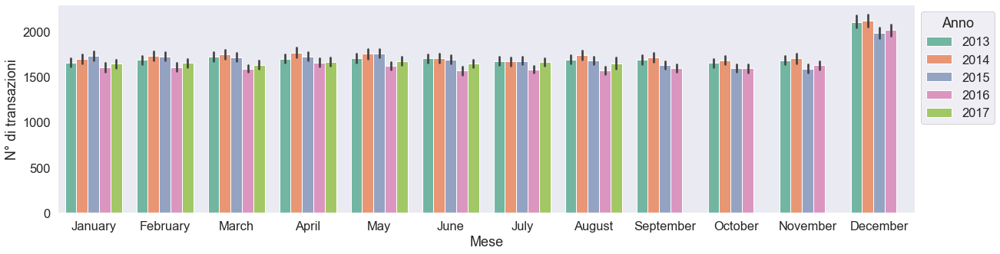

In [9]:
data = transactions.copy()
data['date'] = pd.to_datetime(data['date'])
data['year'] = data['date'].dt.year
data['month_names'] = data['date'].dt.month_name()

plt.figure(figsize=(20,5))
sns.barplot(data=data, x='month_names', y='transactions', hue='year')
plt.legend(title='Anno', bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('Mese')
plt.ylabel('N° di transazioni')

Si direbbe che l'ultimo mese dell'anno tende ad avere più transazioni rispetto ad altri che rimangono costanti. 

### Transazioni del negozio

Text(0, 0.5, 'Negozio')

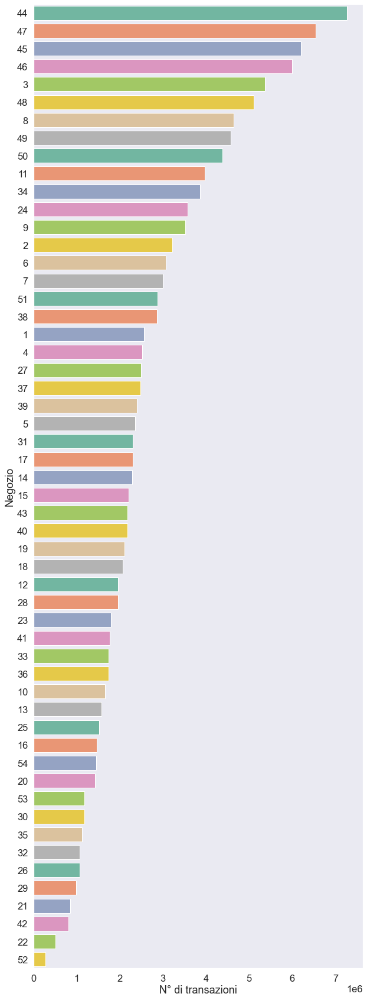

In [10]:
data = transactions.copy()
data = pd.DataFrame(data.groupby('store_nbr')['transactions'].sum().sort_values(ascending=False)).reset_index()

plt.subplots(1,1, figsize=(10,30))
sns.barplot(data=data, y='store_nbr', x='transactions', palette='Set2', orient='h', order=data['store_nbr'].unique())
plt.xlabel('N° di transazioni')
plt.ylabel('Negozio')

#### Annuali

Wall time: 2 s


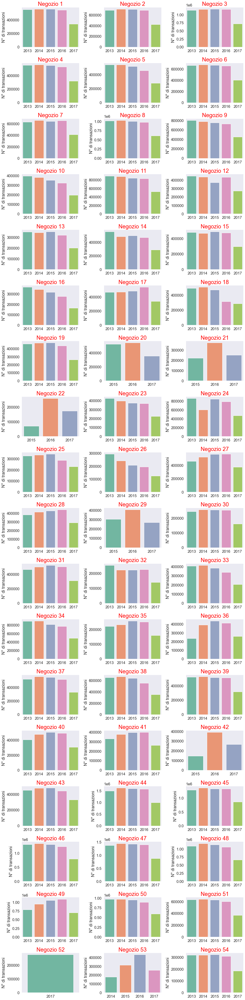

In [11]:
%%time

annual_transactions_store = transactions.copy()
annual_transactions_store['date'] = pd.to_datetime(annual_transactions_store['date'])
annual_transactions_store['year'] = annual_transactions_store['date'].dt.year
annual_transactions_store = pd.DataFrame(annual_transactions_store.groupby(['year','store_nbr'])['transactions'].sum()).reset_index()

fig, axs = plt.subplots(18,3, figsize=(15,60))

row = 0
col = 0
num = 0
condition = [num for num in range(3,55,3)]

for i in range(1,55):
    data = annual_transactions_store[annual_transactions_store['store_nbr'] == i]
    sns.barplot(data=data, x='year', y='transactions', ax=axs[row, col])
    axs[row,col].set_title('Negozio '+str(i), fontsize=24, color='red')
    axs[row,col].set_xlabel('')
    axs[row,col].set_ylabel('N° di transazioni')
    if condition.count(i) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Nei negozi i risultati tendono a essere diversi tra loro con alcuni in crescita, altri costanti e altri in declino 

#### Mensili 

Wall time: 3.3 s


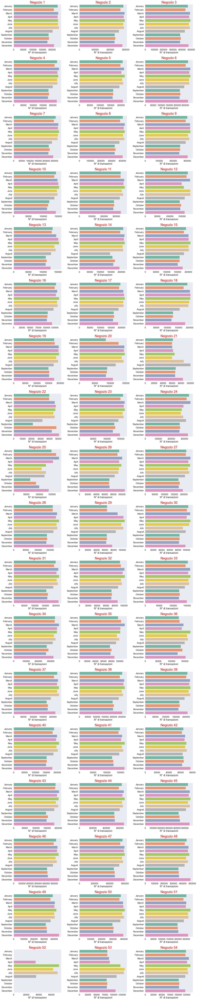

In [12]:
%%time

order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

month_transactions_store = transactions.copy()
month_transactions_store['date'] = pd.to_datetime(month_transactions_store['date'])
month_transactions_store['month'] = month_transactions_store['date'].dt.month_name()
month_transactions_store = pd.DataFrame(month_transactions_store.groupby(['store_nbr','month'])['transactions'].sum()).reset_index()

fig, axs = plt.subplots(18,3, figsize=(20,100))

row = 0
col = 0
condition = [num for num in range(3,55,3)]

for i in range(1,55):
    data = month_transactions_store[month_transactions_store['store_nbr'] == i]
    sns.barplot(data=data, y='month', x='transactions', ax=axs[row, col], order=order, palette='Set2')
    axs[row,col].set_title('Negozio '+str(i), fontsize=24, color='red')
    axs[row,col].set_ylabel('')
    axs[row,col].set_xlabel('N° di transazioni')
    if condition.count(i) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Si nota che in molti negozi tendeno a avere meno transazioni tra agosto e novembre, ma questo può essere dovuto al fatto che per l'anno 2017 abbiamo i dati fino a meta agosto 2017

 #### Settimanale

Wall time: 2.62 s


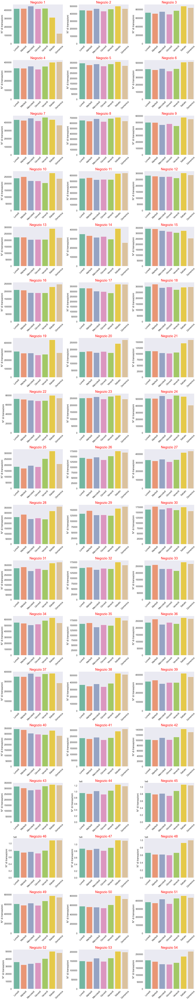

In [13]:
%%time

week_name = {0:'Lunedì', 1:'Martedì', 2:'Mercoledì', 3:'Giovedì', 4:'Venerdì',5:'Sabato', 6:'Domenica'}
order = ['Lunedì', 'Martedì', 'Mercoledì', 'Giovedì', 'Venerdì', 'Sabato', 'Domenica']

day_transactions_store = transactions.copy()
day_transactions_store['date'] = pd.to_datetime(day_transactions_store['date'])
day_transactions_store['day_weeks'] = day_transactions_store['date'].dt.dayofweek
day_transactions_store['day_weeks'].replace(week_name, inplace=True)
day_transactions_store = pd.DataFrame(day_transactions_store.groupby(['day_weeks','store_nbr'])['transactions'].sum()).reset_index()

fig, axs = plt.subplots(18,3, figsize=(20,100))

row = 0
col = 0
condition = [num for num in range(3,55,3)]

for i in range(1,55):
    data = day_transactions_store[day_transactions_store['store_nbr'] == i]
    sns.barplot(data=data, x='day_weeks', y='transactions', ax=axs[row, col], order=order, palette='Set2')
    axs[row,col].set_title('Negozio '+str(i), fontsize=24, color='red')
    axs[row,col].set_xlabel('')
    axs[row,col].set_xticklabels(order, rotation=45)
    axs[row,col].set_ylabel('N° di transazioni')
    if condition.count(i) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Nella maggioranza dei negozi tendono a avere più transazioni durante il weekend

## Vendite

Per le vendite avremmo più dati a disposizioni che si traduce in più grafici.

### Vendite annuali per mese

Wall time: 155 ms


Text(0, 0.5, 'Vendite')

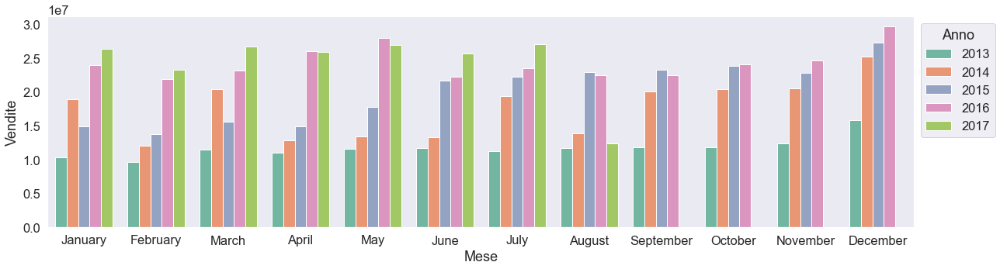

In [14]:
%%time

data = dataset['sales'].resample('M').sum()
data = pd.DataFrame(data).reset_index()
data['year'] = data['date'].dt.year
data['month_names'] = data['date'].dt.month_name()
data.drop(columns='date', inplace=True)

plt.figure(figsize=(20,5))
sns.barplot(data=data, x='month_names', y='sales', hue='year')
plt.legend(title='Anno', bbox_to_anchor=(1,1), loc="upper left")
plt.xlabel('Mese')
plt.ylabel('Vendite')

Se per le transazioni erano costanti nel tempo per le vendite si nota una crescita nel tempo.                         
Ps: I dati dopo 15 agosto 2017 non sono disponibili

### Vendite per dipartimento

Wall time: 315 ms


Text(0, 0.5, 'Dipartimento')

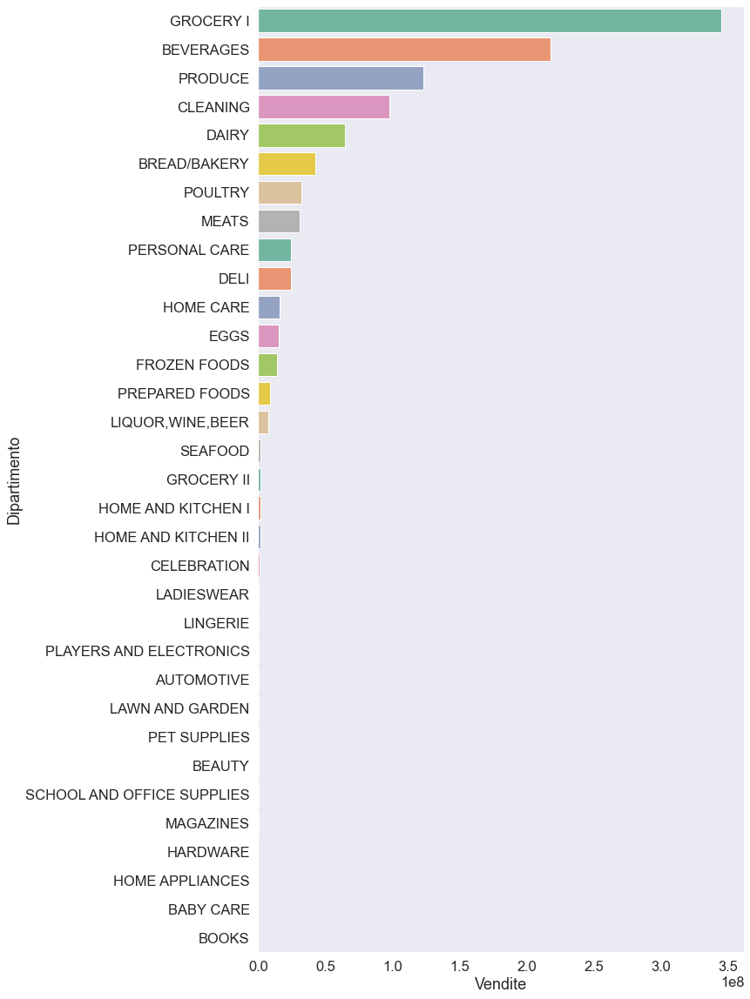

In [15]:
%%time

data = dataset[dataset['sales'] != 0][['family', 'sales']].reset_index()
data = pd.DataFrame(data.groupby('family')['sales'].sum().sort_values(ascending=False)).reset_index()

plt.subplots(1,1, figsize=(10,20))
sns.barplot(data=data, y='family', x='sales', palette='Set2', order=data['family'].unique())
plt.xlabel('Vendite')
plt.ylabel('Dipartimento')

Si vede che le vendite sono concentrati in pochi dipartimenti

 #### Annuali

Wall time: 1.73 s


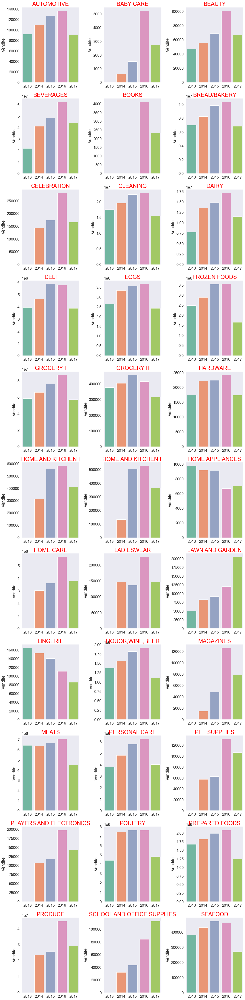

In [16]:
%%time

annual_sales_department = dataset[dataset['sales'] != 0][['family', 'sales']].reset_index()
annual_sales_department['year'] = annual_sales_department['date'].dt.year
annual_sales_department = pd.DataFrame(annual_sales_department.groupby(['year','family'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(11,3, figsize=(15,60))

row = 0
col = 0
num = 0
condition = [num for num in range(3,35,3)]

for i in dataset['family'].unique():
    num = num + 1 
    data = annual_sales_department[annual_sales_department['family'] == i]
    sns.barplot(data=data, x='year', y='sales', ax=axs[row, col])
    axs[row,col].set_title(i, fontsize=24, color='red')
    axs[row,col].set_xlabel('')
    axs[row,col].set_ylabel('Vendite')
    if condition.count(num) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Dai multi grafici si vede che nella maggioranza dei dipartimenti crescono annualmente.

#### Mensili

Wall time: 2.84 s


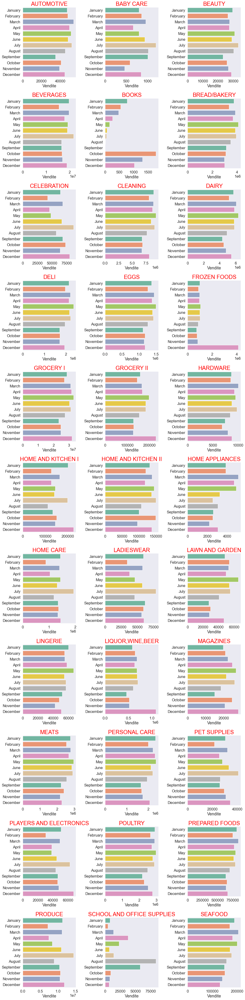

In [17]:
%%time

order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

month_sales_department = dataset[dataset['sales'] != 0][['family', 'sales']].reset_index()
month_sales_department['month'] = month_sales_department['date'].dt.month_name()
month_sales_department = pd.DataFrame(month_sales_department.groupby(['month','family'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(11,3, figsize=(15,60))

row = 0
col = 0
num = 0
condition = [num for num in range(3,35,3)]

for i in dataset['family'].unique():
    num = num + 1 
    data = month_sales_department[month_sales_department['family'] == i]
    sns.barplot(data=data, y='month', x='sales', ax=axs[row, col], order=order, palette='Set2')
    axs[row,col].set_title(i, fontsize=24, color='red')
    axs[row,col].set_xlabel('Vendite')
    axs[row,col].set_ylabel('')
    if condition.count(num) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Si nota che in alcuni dipartimenti tendono a vendere di più in alcuni mesi e meno in altri

#### Settimanale

Wall time: 2.12 s


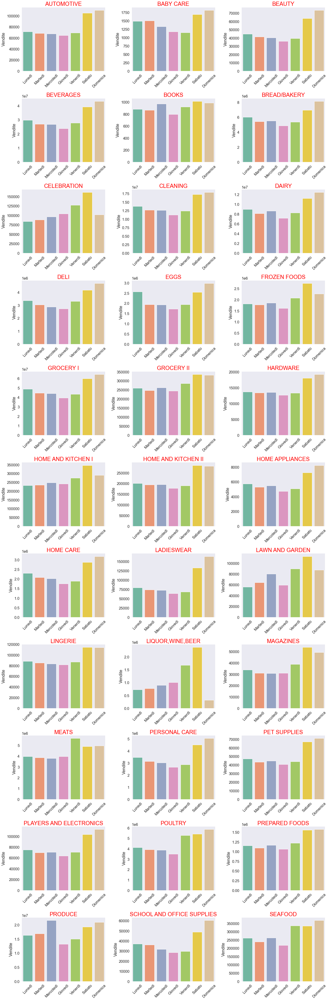

In [18]:
%%time

week_name = {0:'Lunedì', 1:'Martedì', 2:'Mercoledì', 3:'Giovedì', 4:'Venerdì',5:'Sabato', 6:'Domenica'}
order = ['Lunedì', 'Martedì', 'Mercoledì', 'Giovedì', 'Venerdì', 'Sabato', 'Domenica']

day_sales_department = dataset[dataset['sales'] != 0][['family', 'sales']].reset_index()
day_sales_department['day_weeks'] = day_sales_department['date'].dt.dayofweek
day_sales_department['day_weeks'].replace(week_name, inplace=True)
day_sales_department = pd.DataFrame(day_sales_department.groupby(['day_weeks','family'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(11,3, figsize=(20,60))

row = 0
col = 0
num = 0
condition = [num for num in range(3,35,3)]

for i in dataset['family'].unique():
    num = num + 1 
    data = day_sales_department[day_sales_department['family'] == i]
    sns.barplot(data=data, x='day_weeks', y='sales', ax=axs[row, col], order=order, palette='Set2')
    axs[row,col].set_title(i, fontsize=24, color='red')
    axs[row,col].set_xlabel('')
    axs[row,col].set_xticklabels(order, rotation=45)
    axs[row,col].set_ylabel('Vendite')
    if condition.count(num) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Si nota che le vendite sono più alte durante il weekend

#### Città

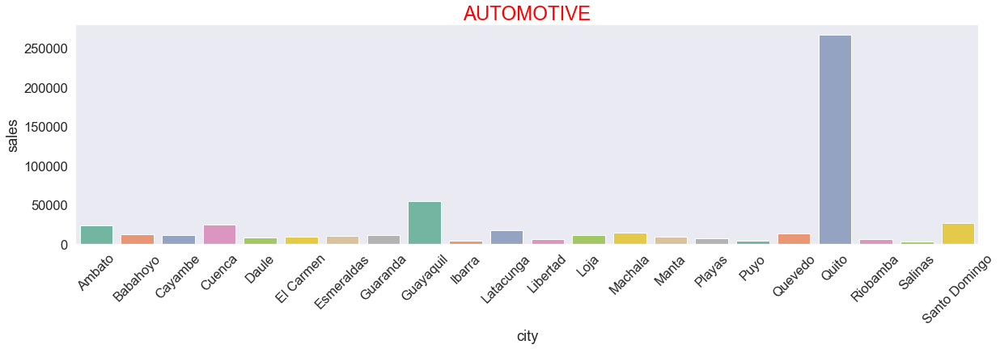

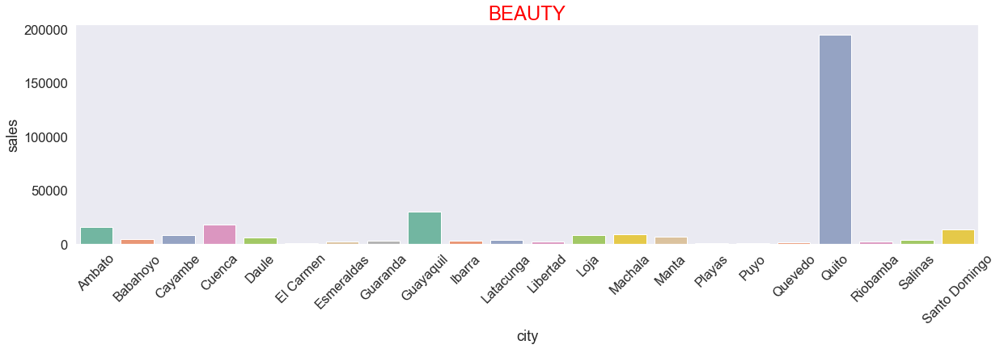

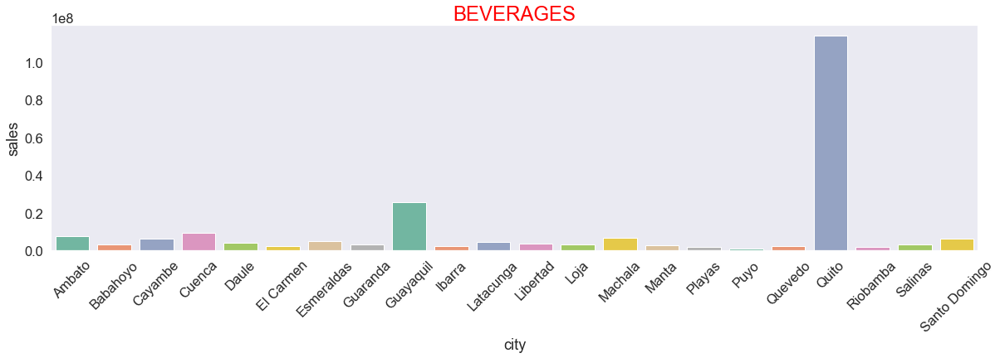

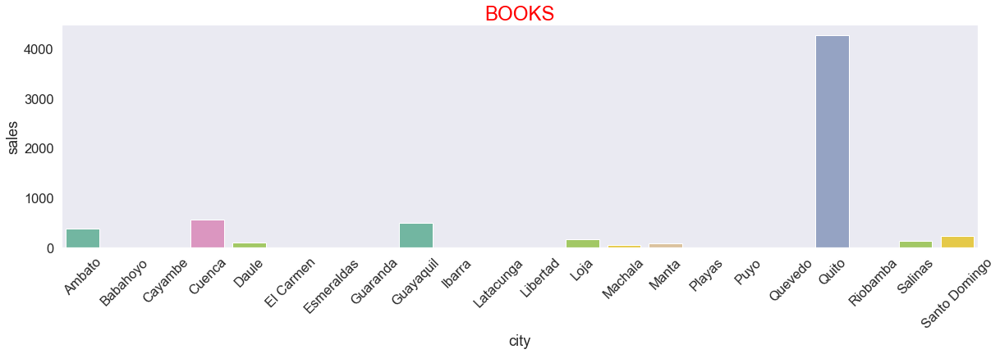

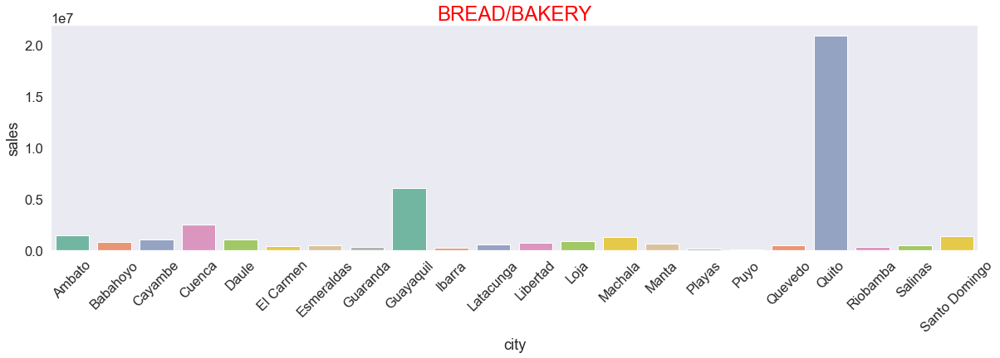

...

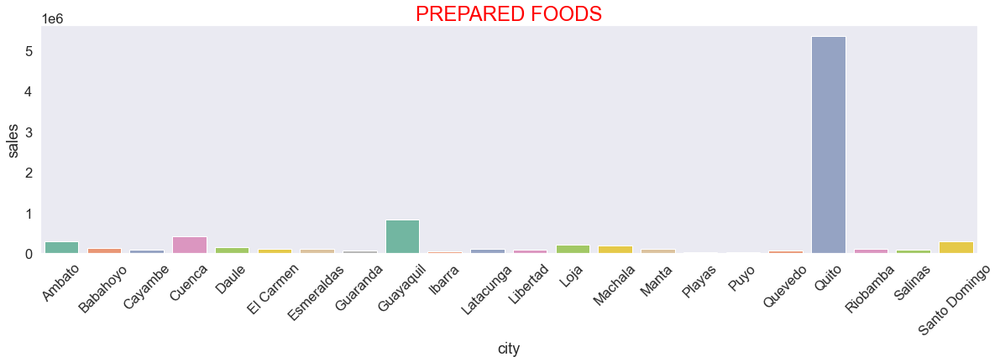

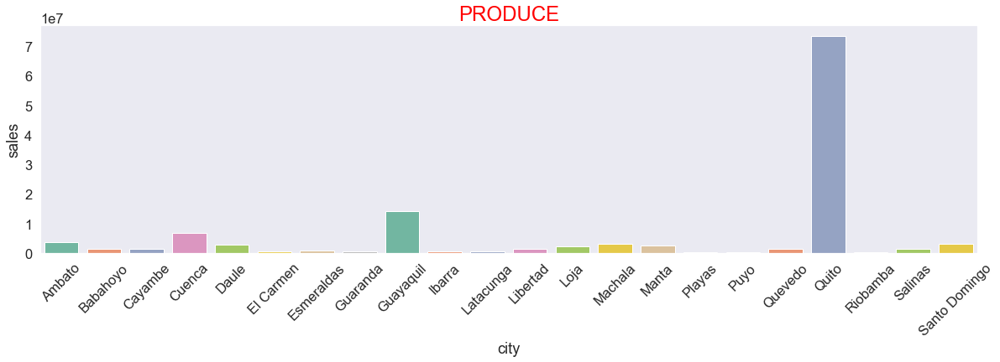

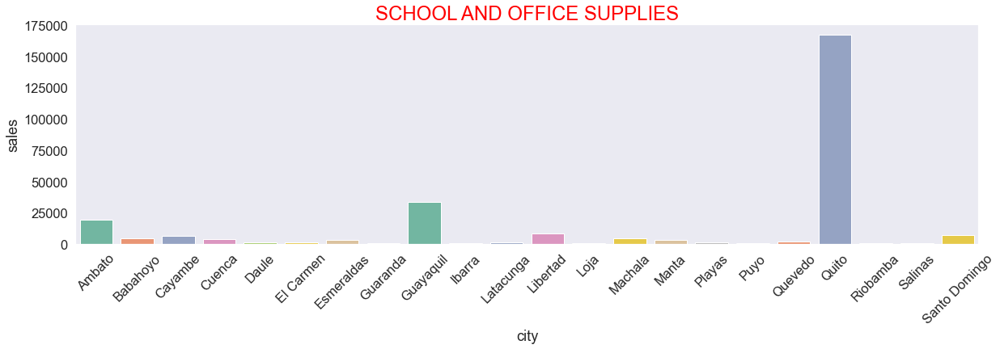

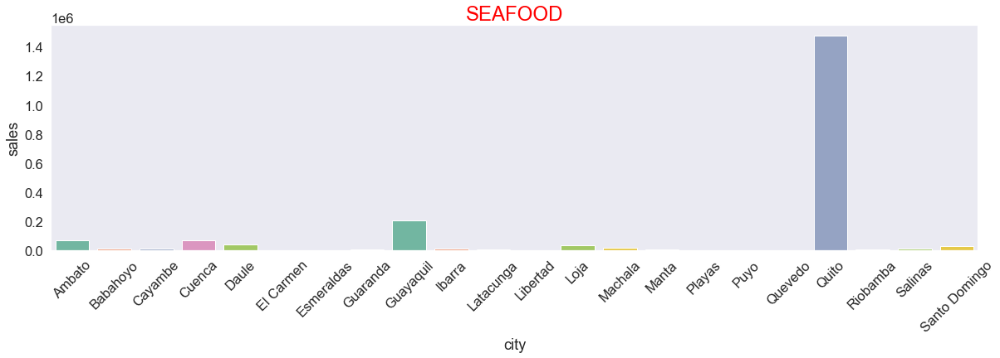

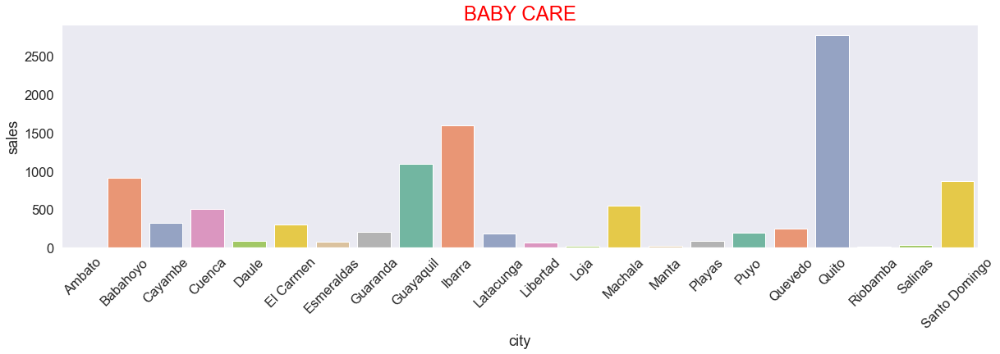

Wall time: 8.79 s


In [19]:
%%time

city_sales_department = dataset[dataset['sales'] != 0][['family', 'sales','city']].reset_index()
city_sales_department = pd.DataFrame(city_sales_department.groupby(['city','family'])['sales'].sum()).reset_index()
city_sales_department = city_sales_department[city_sales_department['sales'] != 0]

for i in city_sales_department['family'].unique():
    plt.figure(figsize=(20,5))
    data = city_sales_department[city_sales_department['family'] == i].sort_values('sales', ascending=False)
    sns.barplot(data=data, x='city', y='sales', palette='Set2')
    plt.title(i, fontsize=24, color='red')
    plt.xticks(rotation=45)
    plt.show()

fig.tight_layout()

### Vendite per negozio

Wall time: 146 ms


Text(0, 0.5, 'Vendite')

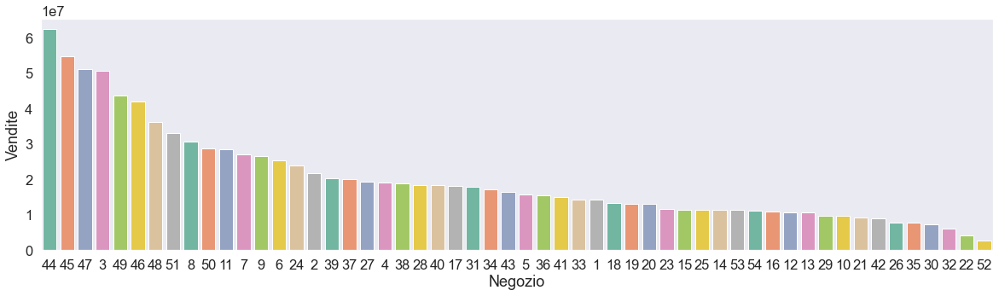

In [20]:
%%time

data = pd.DataFrame(dataset.groupby('store_nbr')['sales'].sum()).sort_values('sales', ascending=False).reset_index()

plt.subplots(1,1, figsize=(20,5))
sns.barplot(data=data, x='store_nbr', y='sales', palette='Set2', order=data['store_nbr'].unique())
plt.xlabel('Negozio')
plt.ylabel('Vendite')


#### Annuali

Wall time: 2.49 s


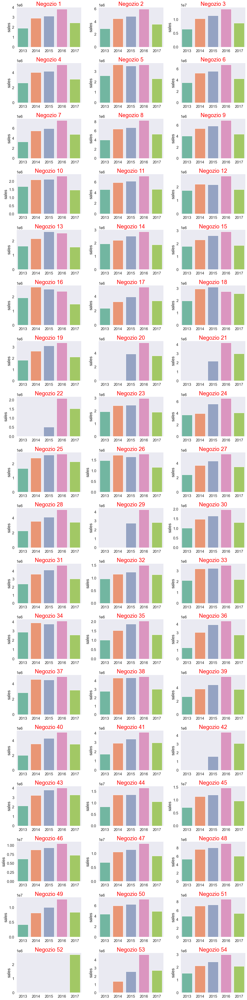

In [21]:
%%time

annual_sales_store = dataset.copy().reset_index()
annual_sales_store['year'] = annual_sales_store['date'].dt.year
annual_sales_store = pd.DataFrame(annual_sales_store.groupby(['store_nbr','year'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(18,3, figsize=(15,60))

row = 0
col = 0
condition = [num for num in range(3,55,3)]

for i in range(1,55):
    data = annual_sales_store[annual_sales_store['store_nbr'] == i]
    sns.barplot(data=data, x='year', y='sales', ax=axs[row, col])
    axs[row,col].set_title('Negozio '+str(i), fontsize=24, color='red')
    axs[row,col].set_xlabel('')
    if condition.count(i) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Nella maggioranza dei negozi si nota una crescita mentre per i nuovi negozi bisognera avere più dati per vederne il trend

#### Mensili

Wall time: 4.47 s


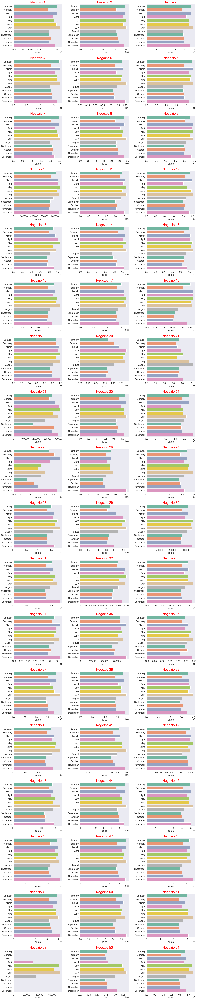

In [22]:
%%time

order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

month_sales_store = dataset.copy().reset_index()
month_sales_store['month'] = month_sales_store['date'].dt.month_name()
month_sales_store = pd.DataFrame(month_sales_store.groupby(['store_nbr','month'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(18,3, figsize=(20,100))

row = 0
col = 0
condition = [num for num in range(3,55,3)]

for i in range(1,55):
    data = month_sales_store[month_sales_store['store_nbr'] == i]
    sns.barplot(data=data, y='month', x='sales', ax=axs[row, col], order=order, palette='Set2')
    axs[row,col].set_title('Negozio '+str(i), fontsize=24, color='red')
    axs[row,col].set_ylabel('')
    if condition.count(i) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Si nota che in molti negozi tendeno a vendere di meno tra agosto e novembre, ma questo può essere dovuto al fatto che per l'anno 2017 abbiamo i dati fino a meta agosto 2017

#### Settimanale

Wall time: 3.13 s


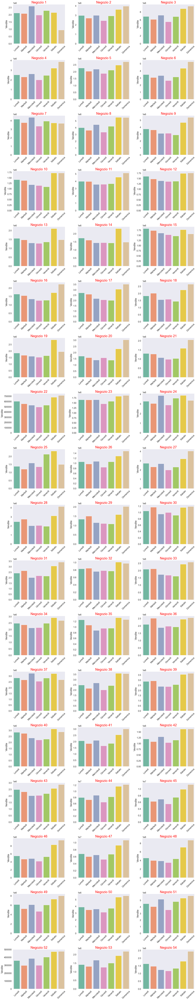

In [23]:
%%time

week_name = {0:'Lunedì', 1:'Martedì', 2:'Mercoledì', 3:'Giovedì', 4:'Venerdì',5:'Sabato', 6:'Domenica'}
order = ['Lunedì', 'Martedì', 'Mercoledì', 'Giovedì', 'Venerdì', 'Sabato', 'Domenica']

day_sales_store = dataset.copy().reset_index()
day_sales_store['day_weeks'] = day_sales_store['date'].dt.dayofweek
day_sales_store['day_weeks'].replace(week_name, inplace=True)
day_sales_store = pd.DataFrame(day_sales_store.groupby(['store_nbr','day_weeks'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(18,3, figsize=(20,100))

row = 0
col = 0
condition = [num for num in range(3,55,3)]

for i in range(1,55):
    data = day_sales_store[day_sales_store['store_nbr'] == i]
    sns.barplot(data=data, x='day_weeks', y='sales', ax=axs[row, col], order=order, palette='Set2')
    axs[row,col].set_title('Negozio '+str(i), fontsize=24, color='red')
    axs[row,col].set_xlabel('')
    axs[row,col].set_xticklabels(order, rotation=45)
    axs[row,col].set_ylabel('Vendite')
    if condition.count(i) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Nella maggioranza dei negozi tendono a vendere di più durante il weekend

### Vendite per città

<AxesSubplot:xlabel='sales', ylabel='city'>

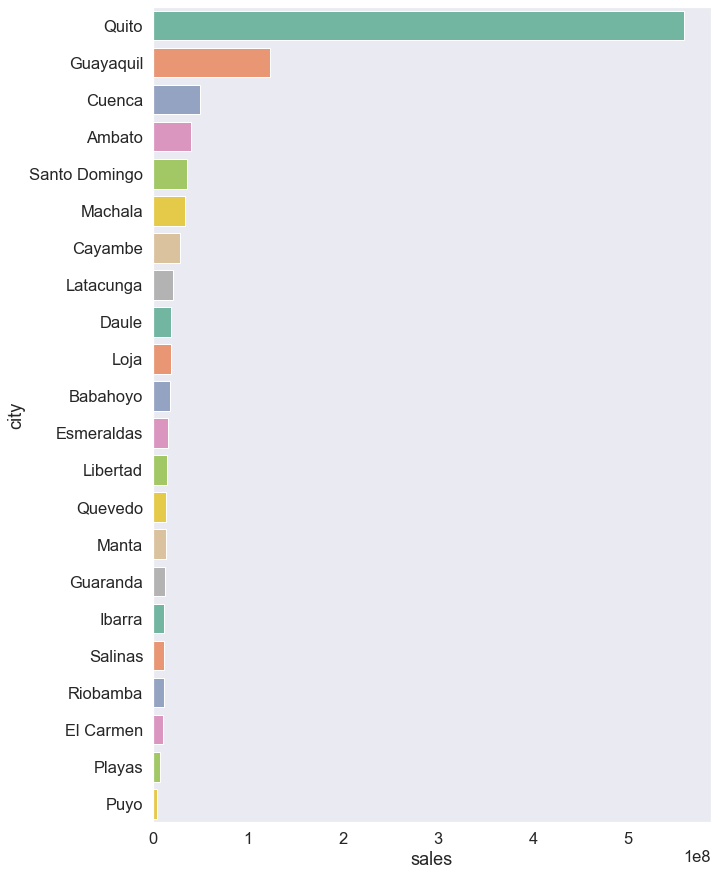

In [24]:
city = pd.DataFrame(dataset.groupby(['city'])['sales'].sum()).reset_index().sort_values('sales', ascending=False)

plt.figure(figsize=(10,15))
sns.barplot(data=city, y='city', x='sales', palette='Set2', order=city['city'].unique())

Le vendite sono concentrate su poche città

#### Annuali

Wall time: 1.45 s


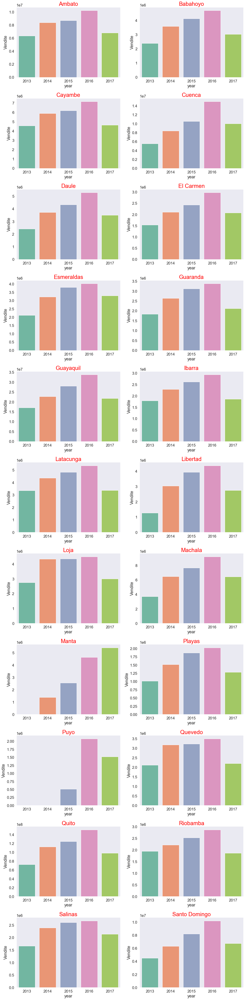

In [25]:
%%time

annual_sales_city = dataset.copy().reset_index()
annual_sales_city['year'] = annual_sales_city['date'].dt.year
annual_sales_city = pd.DataFrame(annual_sales_city.groupby(['year','city'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(11,2, figsize=(15,60))

row = 0
col = 0
num = 0
condition = [num for num in range(2,23,2)]

for i in annual_sales_city['city'].unique():
    num = num + 1
    data = annual_sales_city[annual_sales_city['city'] == i]
    sns.barplot(data=data, x='year', y='sales', ax=axs[row, col], palette='Set2')
    axs[row,col].set_title(str(i), fontsize=24, color='red')
    axs[row,col].set_ylabel('Vendite')
    if condition.count(num) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Trend di crescita per quasi tutte le città

#### Mensile


Wall time: 2.41 s


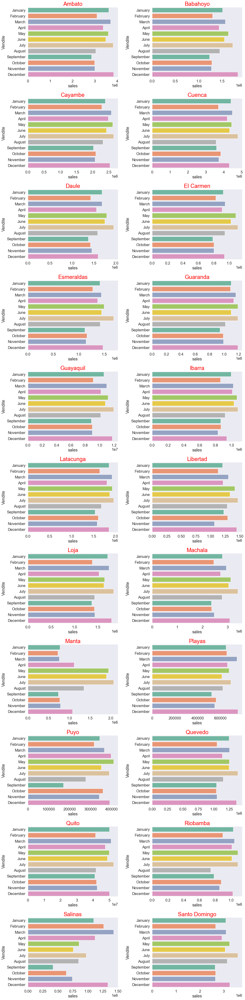

In [26]:
%%time

order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

month_sales_city = dataset.copy().reset_index()
month_sales_city['month'] = month_sales_city['date'].dt.month_name()
month_sales_city = pd.DataFrame(month_sales_city.groupby(['month','city'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(11,2, figsize=(15,60))

row = 0
col = 0
num = 0
condition = [num for num in range(2,23,2)]

for i in month_sales_city['city'].unique():
    num = num + 1
    data = month_sales_city[month_sales_city['city'] == i]
    sns.barplot(data=data, y='month', x='sales', ax=axs[row, col], palette='Set2', order=order)
    axs[row,col].set_title(str(i), fontsize=24, color='red')
    axs[row,col].set_ylabel('Vendite')
    if condition.count(num) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Sembrerebbe che alcune città abbiano più vendite in alcuni mesi mentre altri di meno

#### Settimanale

Wall time: 1.6 s


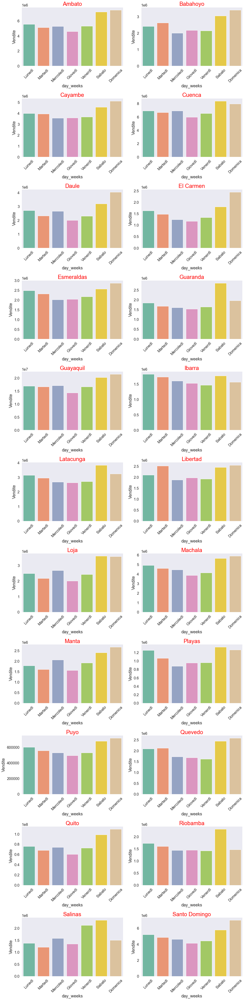

In [27]:
%%time

week_name = {0:'Lunedì', 1:'Martedì', 2:'Mercoledì', 3:'Giovedì', 4:'Venerdì',5:'Sabato', 6:'Domenica'}
order = ['Lunedì', 'Martedì', 'Mercoledì', 'Giovedì', 'Venerdì', 'Sabato', 'Domenica']

day_sales_city = dataset.copy().reset_index()
day_sales_city['day_weeks'] = day_sales_city['date'].dt.dayofweek
day_sales_city['day_weeks'].replace(week_name, inplace=True)
day_sales_city = pd.DataFrame(day_sales_city.groupby(['day_weeks','city'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(11,2, figsize=(15,60))

row = 0
col = 0
num = 0
condition = [num for num in range(2,23,2)]

for i in day_sales_city['city'].unique():
    num = num + 1
    data = day_sales_city[day_sales_city['city'] == i]
    sns.barplot(data=data, x='day_weeks', y='sales', ax=axs[row, col], palette='Set2', order=order)
    axs[row,col].set_title(str(i), fontsize=24, color='red')
    axs[row,col].set_ylabel('Vendite')
    axs[row,col].set_xticklabels(order, rotation=45)
    if condition.count(num) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

Niente da aggiungere

### Vendite per regione

<AxesSubplot:xlabel='sales', ylabel='state'>

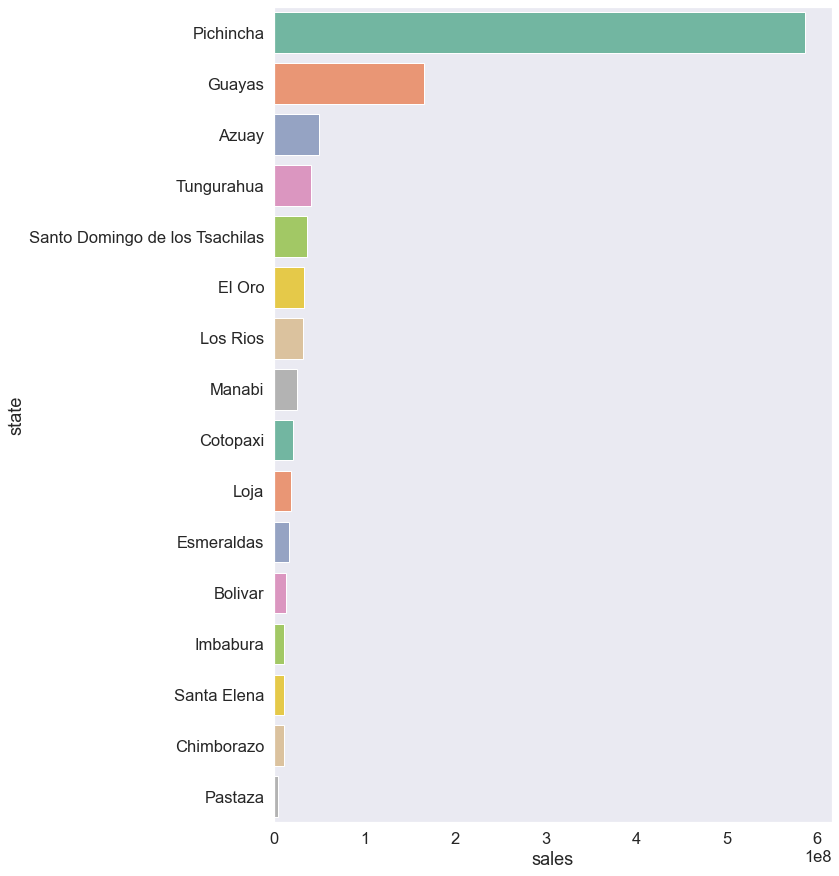

In [28]:
state = pd.DataFrame(dataset.groupby(['state'])['sales'].sum()).reset_index().sort_values('sales', ascending=False)

plt.figure(figsize=(10,15))
sns.barplot(data=state, y='state', x='sales', palette='Set2', order=state['state'].unique())

#### Annuali

Wall time: 1.05 s


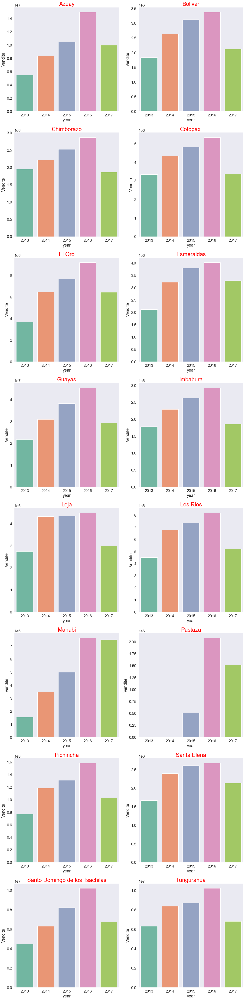

In [29]:
%%time

annual_sales_state = dataset.copy().reset_index()
annual_sales_state['year'] = annual_sales_state['date'].dt.year
annual_sales_state = pd.DataFrame(annual_sales_state.groupby(['year','state'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(8,2, figsize=(15,60))

row = 0
col = 0
num = 0
condition = [num for num in range(2,23,2)]

for i in annual_sales_state['state'].unique():
    num = num + 1
    data = annual_sales_state[annual_sales_state['state'] == i]
    sns.barplot(data=data, x='year', y='sales', ax=axs[row, col], palette='Set2')
    axs[row,col].set_title(str(i), fontsize=24, color='red')
    axs[row,col].set_ylabel('Vendite')
    if condition.count(num) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

#### Mensili

Wall time: 2.73 s


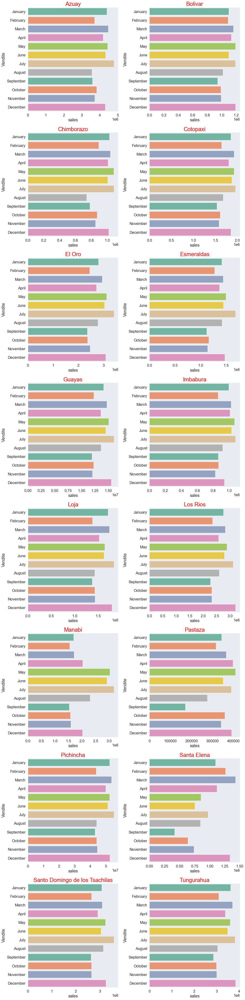

In [30]:
%%time

order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

month_sales_state = dataset.copy().reset_index()
month_sales_state['month'] = month_sales_state['date'].dt.month_name()
month_sales_state = pd.DataFrame(month_sales_state.groupby(['month','state'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(8,2, figsize=(15,60))

row = 0
col = 0
num = 0
condition = [num for num in range(2,23,2)]

for i in month_sales_state['state'].unique():
    num = num + 1
    data = month_sales_state[month_sales_state['state'] == i]
    sns.barplot(data=data, y='month', x='sales', ax=axs[row, col], palette='Set2', order=order)
    axs[row,col].set_title(str(i), fontsize=24, color='red')
    axs[row,col].set_ylabel('Vendite')
    if condition.count(num) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

#### Settimanale

Wall time: 1.57 s


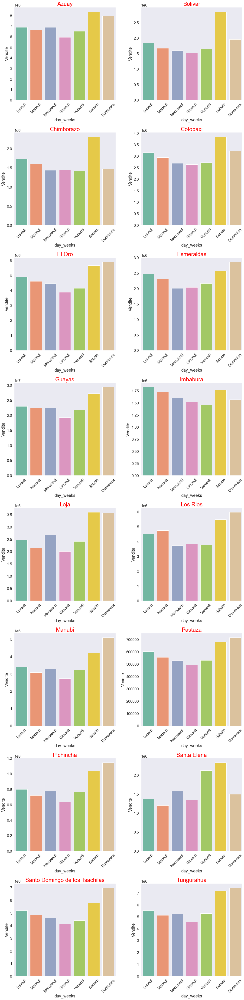

In [31]:
%%time

week_name = {0:'Lunedì', 1:'Martedì', 2:'Mercoledì', 3:'Giovedì', 4:'Venerdì',5:'Sabato', 6:'Domenica'}
order = ['Lunedì', 'Martedì', 'Mercoledì', 'Giovedì', 'Venerdì', 'Sabato', 'Domenica']

day_sales_state = dataset.copy().reset_index()
day_sales_state['day_weeks'] = day_sales_state['date'].dt.dayofweek
day_sales_state['day_weeks'].replace(week_name, inplace=True)
day_sales_state = pd.DataFrame(day_sales_state.groupby(['day_weeks','state'])['sales'].sum()).reset_index()

fig, axs = plt.subplots(8,2, figsize=(15,60))

row = 0
col = 0
num = 0
condition = [num for num in range(2,23,2)]

for i in day_sales_state['state'].unique():
    num = num + 1
    data = day_sales_state[day_sales_state['state'] == i]
    sns.barplot(data=data, x='day_weeks', y='sales', ax=axs[row, col], palette='Set2', order=order)
    axs[row,col].set_title(str(i), fontsize=24, color='red')
    axs[row,col].set_ylabel('Vendite')
    axs[row,col].set_xticklabels(order, rotation=45)
    if condition.count(num) > 0:
        row = row + 1
        col = 0
    else:
        col = col + 1

fig.tight_layout()

## Confronto

Da qui in poi andrò a fare vari confronti nel tempo di valori continui (Numeri), oltre a ottimizzare il dataset in formato giornaliero come visto sotto poiché alcune categorie non sono più presenti, effettuando una somma o media dei valori.

In [32]:
%%time

tr = transactions.copy()
tr['date'] = pd.to_datetime(tr['date'])
tr.set_index('date',inplace=True)

data = pd.DataFrame(dataset['sales'].resample('D').sum())
data['oil_price'] = dataset['oil_price'].resample('D').mean()
data['transactions'] = tr['transactions'].resample('D').sum()
data['onpromotion'] = dataset['onpromotion'].resample('D').sum()
data['number'] = 0
data.head()

Wall time: 141 ms


,sales,oil_price,transactions,onpromotion,number
date,,,,,
2013-01-01,2511.618999,93.14,770.0,0,0
2013-01-02,496092.417944,93.14,93215.0,0,0
2013-01-03,361461.231124,92.97,78504.0,0,0
2013-01-04,354459.677093,93.12,78494.0,0,0
2013-01-05,477350.121229,93.12,93573.0,0,0


### Andamento delle vendite e prezzo del petrolio

Vado a utilizzare una media di 30 giorni per rendere più facile da leggere il grafico

Wall time: 31.2 ms


Text(0, 0.5, 'Vendite')

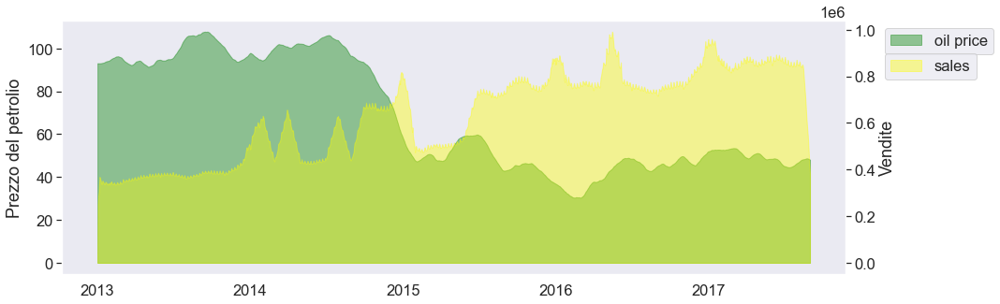

In [33]:
%%time

mean_mobile = data.rolling(30, min_periods=1).mean()

fig, ax1 = plt.subplots(figsize=(15,5))
ax1.fill_between(mean_mobile.index, mean_mobile.number, mean_mobile.oil_price, alpha=0.4, color='green', label='oil price')
ax2 = ax1.twinx()
ax2.fill_between(mean_mobile.index, mean_mobile.number, mean_mobile.sales, alpha=0.4, color='yellow', label='sales')
ax1.legend(bbox_to_anchor=(1.04,1), loc="upper left")
ax2.legend(bbox_to_anchor=(1.04,0.9), loc="upper left")
ax1.set_ylabel('Prezzo del petrolio')
ax2.set_ylabel('Vendite')

Sembrebbe che con la dimuizione del prezzo del petrolio le vendite inizino a salire

### Andamento delle promozioni e transazioni

Wall time: 31.3 ms


Text(0, 0.5, 'Vendite')

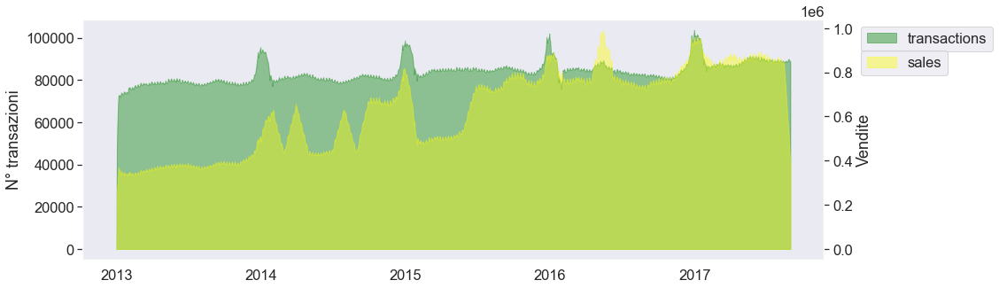

In [34]:
%%time

mean_mobile = data.rolling(30, min_periods=1).mean()

fig, ax1 = plt.subplots(figsize=(15,5))
ax1.fill_between(mean_mobile.index, mean_mobile.number, mean_mobile.transactions, alpha=0.4, color='green', label='transactions')
ax2 = ax1.twinx()
ax2.fill_between(mean_mobile.index, mean_mobile.number, mean_mobile.sales, alpha=0.4, color='yellow', label='sales')
ax1.legend(bbox_to_anchor=(1.04,1), loc="upper left")
ax2.legend(bbox_to_anchor=(1.04,0.9), loc="upper left")
ax1.set_ylabel('N° transazioni')
ax2.set_ylabel('Vendite')

Qui una correlazione tende a vedersi anche se le transazioni rimangono costanti e le vendite crescono si nota che un brusco movimento nelle transazione tende a essere seguito dalle vendite, bisognerà capire se è dovuto ad altri fattori

### Andamento delle promozioni e vendite

Wall time: 31.2 ms


Text(0, 0.5, 'Vendite')

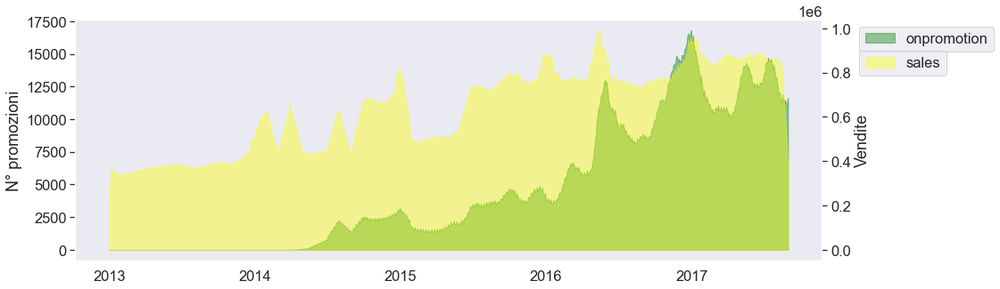

In [35]:
%%time

mean_mobile = data.rolling(30, min_periods=1).mean()

fig, ax1 = plt.subplots(figsize=(15,5))
ax1.fill_between(mean_mobile.index, mean_mobile.number, mean_mobile.onpromotion, alpha=0.4, color='green', label='onpromotion')
ax2 = ax1.twinx()
ax2.fill_between(mean_mobile.index, mean_mobile.number, mean_mobile.sales, alpha=0.4, color='yellow', label='sales')
ax1.legend(bbox_to_anchor=(1.04,1), loc="upper left")
ax2.legend(bbox_to_anchor=(1.04,0.9), loc="upper left")
ax1.set_ylabel('N° promozioni')
ax2.set_ylabel('Vendite')

Stesso discorso precedente la correlazione è forte nei movimenti, si nota che un numero maggiori di promozioni non si traduce in una vendita più alta

### Correlazioni

Text(0, 0.5, 'N° transazioni')

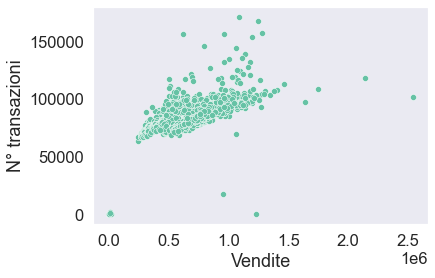

In [36]:
sns.scatterplot(data=data, x='sales', y='transactions')
plt.xlabel('Vendite')
plt.ylabel('N° transazioni')

Come visto sopra la correlazione è forte, l'aumento delle transazioni non tiene il passo all'aumento delle vendite

Text(0, 0.5, 'Prezzo di petrolio')

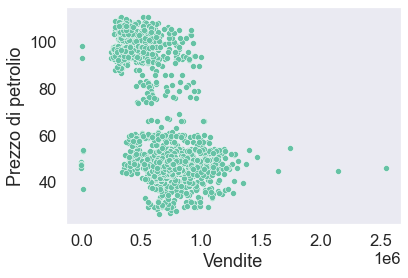

In [37]:
sns.scatterplot(data=data, x='sales', y='oil_price')
plt.xlabel('Vendite')
plt.ylabel('Prezzo di petrolio')

Direi che un basso prezzo del petrolio aumenta le probabilità di vendite alte

Text(0, 0.5, 'Vendite')

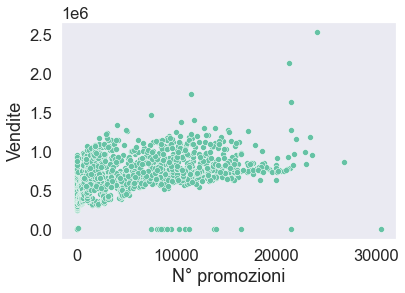

In [38]:
sns.scatterplot(data=data, x='onpromotion', y='sales')
plt.xlabel('N° promozioni')
plt.ylabel('Vendite')

Il grafico da una ottima interpretazione che un numero maggiore di promozioni non si traduce in più vendite

oil_price      -0.074918
cluster         0.038554
transactions    0.233201
onpromotion     0.427505
sales           1.000000
Name: sales, dtype: float64

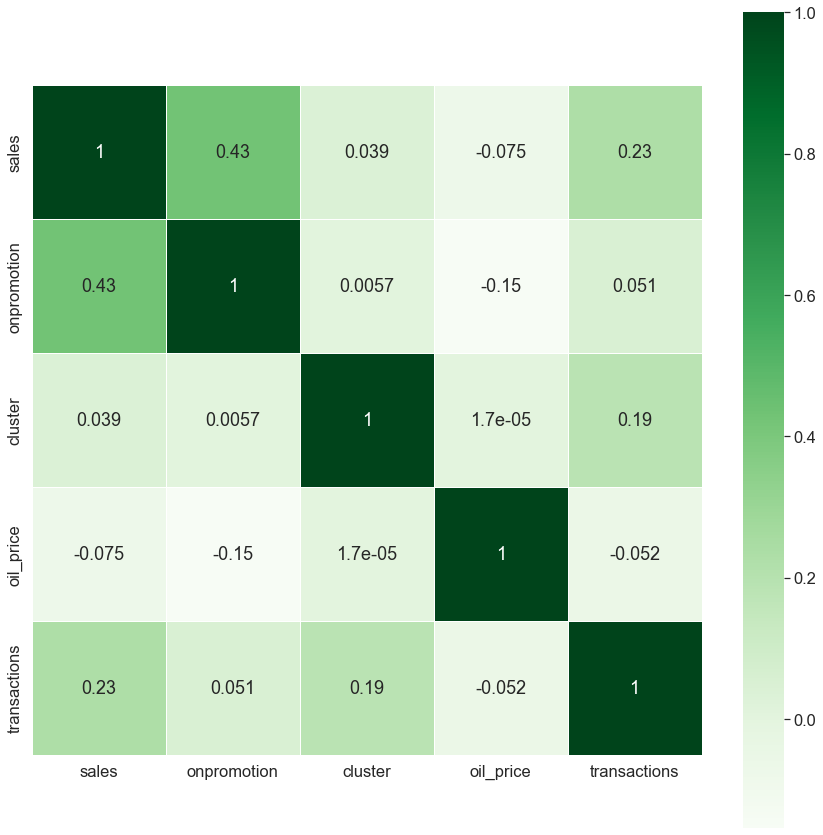

In [39]:
plt.figure(figsize=(15,15))
corr = dataset.corr()
sns.heatmap(corr, annot = True, square=True, linewidths=.5, cmap='Greens')
corr['sales'].sort_values()

# Predizioni

Ora si passa alla fase della predizione, il valore da predire sono le vendite future 

## Features engineering

Questa fase consiste nel rimodellare il dataset togliendo colonne o aggiungendone altre e ecc, solitamente tende a essere un processo ripetitivo con lo scopo di migliorare il modello.

In [40]:
%%time

ewm = False
rolling = True

emw_par = 'alpha' # [com, alpha, span, halflife]
emw_par_values = [0.95, 0.9, 0.8, 0.7, 0.5]
days_mean = [16, 30, 90]

data = dataset.copy()
data.drop(columns=['transactions','nation','state','city','type'], inplace=True)

if rolling:
    for d in days_mean:
        string = str('sales_roll_')+str(d)
        data[string] = data.groupby(["store_nbr", "family"])['sales'].transform(lambda x: x.shift(d).rolling(min_periods=1 ,window=d).mean())

if ewm:
    for epv in emw_par_values:
        for d in days_mean:
            string = 'sales_'+emw_par+'_'+str(epv)+'_shift_'+str(d)
            if emw_par == 'alpha':
                data[string] = data.groupby(["store_nbr", "family"])['sales'].transform(lambda x: x.shift(d).ewm(alpha=epv).mean())
            elif emw_par == 'com':
                data[string] = data.groupby(["store_nbr", "family"])['sales'].transform(lambda x: x.shift(d).ewm(com=epv).mean())
    
data['sales'] = np.log1p(data["sales"].values)

for c in data.columns:
    if data[c].dtypes == 'uint8':
        data[c] = data[c].astype('category')
        
create_date_features(data)
data.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x), inplace=True)
data.shape

Wall time: 5.87 s


(3036792, 19)

Andrò a rimuovere la colonna transazioni poiché non abbiamo i valori per il test e provando a spostare i valori in avanti non si traduce in un miglioramento del modello.

Andrò a aggiungere la media mobile esponenziale e la classica media mobile e usero shift per spostarli in avanti (di giorni non righe) per prevedere le tendenze future, questo tipo di metodo è molto utilizzato nel campo della finanza sopratutto nel trading in borsa per prevedere i prezzi.    
Ps: Ho lasciato che la media esponenziale non si attivasse, facendo dei test il modello sembrebbe che la classica media mobile sia sufficiente. 

Andrò a convertire i valori delle vendite in una funzione logaritmica (log.e(x+1)) molto utile al modello nel caso che ci siano alte variazioni di valori. 

Il modello che andrò a utilizzare non riesce a leggere il formato datetime quindi è neccesario trasformarlo in un formato a etichetta richiamando la funzione all'inizio del progetto.

## Split data

Qui si separano i dati per poi inserirli nel modello, il metodo di separazione consiste, come detto all'inizio del progetto, per il test i dati dopo il 15-08-2017, in più creerò un set di validazione per misurare le prestazione del modello.     

In [41]:
%%time

try:
    data.set_index('date', inplace=True)
except:
    pass

train  = data.loc['2013-01-01':'2017-07-01'].reset_index()
val = data.loc['2017-07-02':'2017-08-15'].reset_index() 
test = data.loc['2017-08-16':].reset_index()

print('train size :', round(train.shape[0]/data.shape[0],3)*100,'%')
print('validation size :', round(val.shape[0]/data.shape[0],3)*100,'%')
print('test size :', round(test.shape[0]/data.shape[0],3)*100,'%')

x_train = train.drop(columns=['date','sales'])
y_train = train['sales']

x_val = val.drop(columns=['date', 'sales'])
y_val = val['sales']

x_test = test.drop(columns=['date','sales'])
y_test = test['sales']

train size : 96.39999999999999 %
validation size : 2.6 %
test size : 0.8999999999999999 %
Wall time: 284 ms


## Modello

Per il modello andrò a utilizzare lo lightGBM invece dello XGBoost per il fatto che la quantità dei dati è molto grande e in questi casi lo Lgbm tende a essere molto più veloce dello XGBoost oltre al fatto che i risultati della metrica usata (rmse) sono simili.

La funzione lgb.Dataset converte i dati in un formato più veloce per il modello, stessa cosa di dMatrix per XGBoost. 

In [42]:
%%time

cat_col = []

for col in train.columns: 
    if pd.api.types.is_categorical_dtype(train[col]):
        cat_col.append(col)

lgbtrain = lgb.Dataset(data=x_train, label=y_train, categorical_feature=cat_col)
lgbval = lgb.Dataset(data=x_val, label=y_val, categorical_feature=cat_col)
lgbtest = lgb.Dataset(data=x_test, label=y_test, categorical_feature=cat_col)

lgb_params = {
              'metric': 'rmse',
              'boosting_type' : 'gbdt',
              'num_leaves': 15,
              'learning_rate': 0.2,
              'max_depth': 13,
              'verbose': 0,
              'nthread': -1,
              'force_col_wise':True}
        
model = lgb.train(params = lgb_params, train_set=lgbtrain,
                  valid_sets=[lgbtrain, lgbval],
                  categorical_feature=cat_col,
                  num_boost_round=3000,
                  early_stopping_rounds=300,
                  verbose_eval=100,
                  )

C:\Users\39380\anaconda3\lib\site-packages\lightgbm\basic.py:1433: UserWarning: Overriding the parameters from Reference Dataset.
  _log_warning('Overriding the parameters from Reference Dataset.')
C:\Users\39380\anaconda3\lib\site-packages\lightgbm\basic.py:1245: UserWarning: categorical_column in param dict is overridden.
  _log_warning('{} in param dict is overridden.'.format(cat_alias))


Training until validation scores don't improve for 300 rounds
[100]	training's rmse: 0.48222	valid_1's rmse: 0.428833
[200]	training's rmse: 0.444435	valid_1's rmse: 0.416671
[300]	training's rmse: 0.42632	valid_1's rmse: 0.41155
[400]	training's rmse: 0.414899	valid_1's rmse: 0.407563
[500]	training's rmse: 0.405271	valid_1's rmse: 0.405478
[600]	training's rmse: 0.398194	valid_1's rmse: 0.403889
[700]	training's rmse: 0.392806	valid_1's rmse: 0.403417
[800]	training's rmse: 0.388337	valid_1's rmse: 0.402316
[900]	training's rmse: 0.384645	valid_1's rmse: 0.401546
[1000]	training's rmse: 0.381401	valid_1's rmse: 0.40083
[1100]	training's rmse: 0.378198	valid_1's rmse: 0.400277
[1200]	training's rmse: 0.375402	valid_1's rmse: 0.400291
[1300]	training's rmse: 0.372928	valid_1's rmse: 0.399742
[1400]	training's rmse: 0.370929	valid_1's rmse: 0.399445
[1500]	training's rmse: 0.368904	valid_1's rmse: 0.399283
[1600]	training's rmse: 0.367286	valid_1's rmse: 0.39929
[1700]	training's rmse: 

## Metriche

In [43]:
%%time

pred = model.predict(x_val, num_iteration=model.best_iteration)
pred[pred < 0] = 0

print('Log')
print('rmse=',mean_squared_log_error(y_val, pred, squared=False))
print('mse=',mean_squared_error(y_val, pred, squared=False))
print()
print('Original')
print('rmse=',mean_squared_log_error(np.expm1(y_val), np.expm1(pred), squared=False))
print('mse=',mean_squared_error(np.expm1(y_val), np.expm1(pred), squared=False))


Log
rmse= 0.16986746364365388
mse= 0.3970867186920232

Original
rmse= 0.3970867186920232
mse= 226.51281943034573
Wall time: 2 s


Si nota che convertendo i valori nel formato originale i risultati tendono a aumentare di molto, questo perché i valori delle vendite soffrono di alte variazioni.

## Feature importance

In questa parte vado a verificare le caratteristiche, per ordine, più importanti per la previsione delle vendite da parte del modello

<AxesSubplot:xlabel='feature_importance', ylabel='feature_name'>

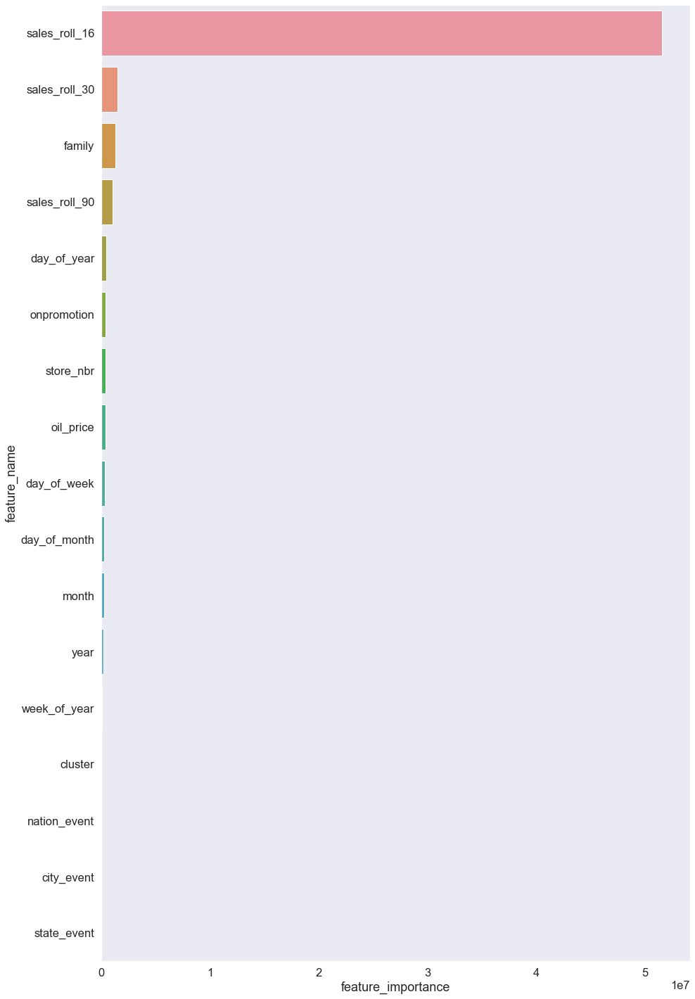

In [44]:
feature_importance = model.feature_importance('gain')
feature_name = model.feature_name()

feature_importance = pd.DataFrame(feature_importance.copy(), columns=['feature_importance'])
feature_importance['feature_name'] = feature_name
feature_importance.sort_values('feature_importance', ascending=False, inplace=True)

plt.figure(figsize=(15,25))
sns.barplot(data=feature_importance, x='feature_importance', y='feature_name')

Si nota che poche caratteristiche tendono a influenzare molto il valore predetto.

## Differenza tra i valori predetti e reali

Text(0.5, 0, 'Vendite reali')

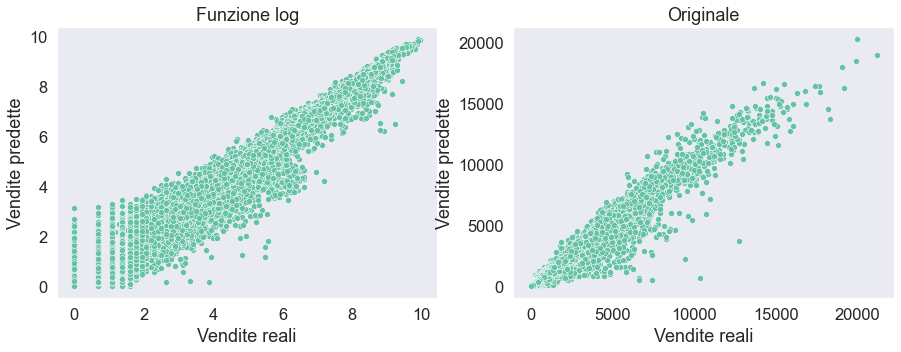

In [45]:
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(15,5))
sns.scatterplot(x=y_val, y=pred, ax=ax1)
sns.scatterplot(x=np.expm1(y_val), y=np.expm1(pred), ax=ax2)
ax1.set_title('Funzione log')
ax2.set_title('Originale')
ax1.set_ylabel('Vendite predette')
ax1.set_xlabel('Vendite reali')
ax2.set_ylabel('Vendite predette')
ax2.set_xlabel('Vendite reali')

La correlazione delle previsioni e reale rimane positiva ma il range di massimo e minimo tende ad essere moderato

Wall time: 375 ms


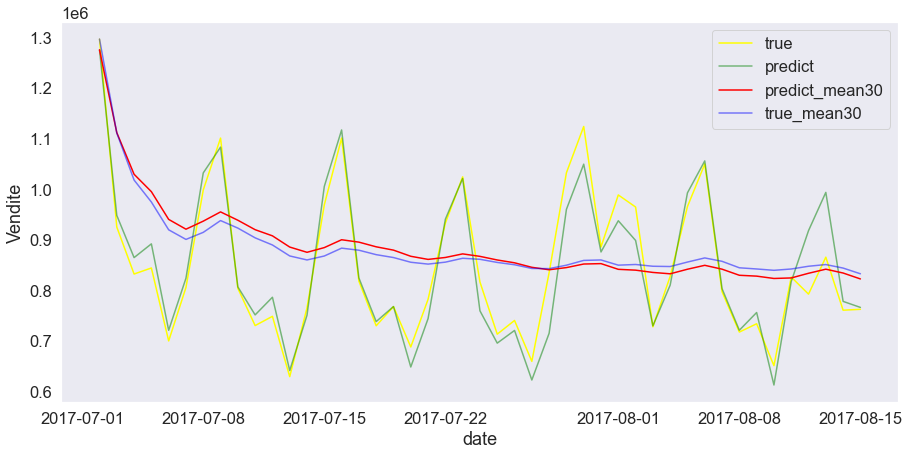

In [46]:
%%time

past_data = False
predict_data = True

d = pd.DataFrame(val['date'])
d['pred'] = np.expm1(pred)
d['true'] = np.expm1(y_val)
d = d.set_index('date').resample('D').sum()
pred_month_mean = d.rolling(window=30, min_periods=1).mean()

past_sales = pd.DataFrame(train.copy()[['date','sales']])
past_sales['sales'] = np.expm1(past_sales['sales'])
past_sales = past_sales.set_index('date').resample('D').sum()
past_month_mean = past_sales.rolling(window=30, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(15,7))
if past_data:
    sns.lineplot(data=past_sales, x='date', y='sales', color='blue', label='past_data')
    sns.lineplot(data=past_month_mean, x='date', y='sales', label='past_data_mean30', color='red')
if predict_data:
    sns.lineplot(data=d, x='date', y='true', label='true', color='yellow')
    sns.lineplot(data=d, x='date', y='pred', label='predict', alpha=0.5, color='green')
    sns.lineplot(data=pred_month_mean, x='date', y='pred', label='predict_mean30', color='red')
    sns.lineplot(data=pred_month_mean, x='date', y='true', label='true_mean30', color='blue', alpha=0.5)
plt.ylabel('Vendite')
plt.legend()

Il margine di errore rimane abbastanza minima

## Predizione finale

In conclusione inseriamo tutti i dati per fare la previsione del test dove i valori delle vendite sono sconosciute

In [47]:
%%time

columns =  feature_importance.reset_index()['feature_name'].values.tolist()
columns.append('sales')
feature_imp = data.copy()[columns]

train  = feature_imp.loc['2013-01-01':'2017-08-15'].reset_index()
test = feature_imp.loc['2017-08-16':].reset_index()

x_train = train.drop(columns=['sales','date'])
y_train = train['sales']

x_test = test.drop(columns=['sales','date'])
y_test = test['sales']

Wall time: 406 ms


In [48]:
%%time

lgbtrain = lgb.Dataset(data=x_train, label=y_train)
lgbtest = lgb.Dataset(data=x_test, label=y_test)

lgb_params = {'objective': 'regression',
              'metric': 'rmse',
              'boosting_type' : 'gbdt',
              'num_leaves': 15,
              'learning_rate': 0.2,
              'max_depth': 13,
              'verbose': 0,
              'nthread': -1,
              'force_col_wise':True}
        
model = lgb.train(params = lgb_params, train_set=lgbtrain,
                  valid_sets=lgbtrain,
                  num_boost_round=2400,
                  early_stopping_rounds=300,
                  verbose_eval=100,
                  )

Training until validation scores don't improve for 300 rounds
[100]	training's rmse: 0.486386
[200]	training's rmse: 0.444897
[300]	training's rmse: 0.426102
[400]	training's rmse: 0.414815
[500]	training's rmse: 0.404176
[600]	training's rmse: 0.397106
[700]	training's rmse: 0.392309
[800]	training's rmse: 0.388067
[900]	training's rmse: 0.383594
[1000]	training's rmse: 0.380889
[1100]	training's rmse: 0.377816
[1200]	training's rmse: 0.375077
[1300]	training's rmse: 0.373062
[1400]	training's rmse: 0.370965
[1500]	training's rmse: 0.369206
[1600]	training's rmse: 0.367585
[1700]	training's rmse: 0.365974
[1800]	training's rmse: 0.364377
[1900]	training's rmse: 0.362883
[2000]	training's rmse: 0.361402
[2100]	training's rmse: 0.360106
[2200]	training's rmse: 0.358974
[2300]	training's rmse: 0.357825
[2400]	training's rmse: 0.356819
Did not meet early stopping. Best iteration is:
[2400]	training's rmse: 0.356819
Wall time: 2min 31s


In [49]:
%%time

pred = model.predict(x_test, num_iteration=model.best_iteration)
pred[pred < 0] = 0

Wall time: 741 ms


Wall time: 407 ms


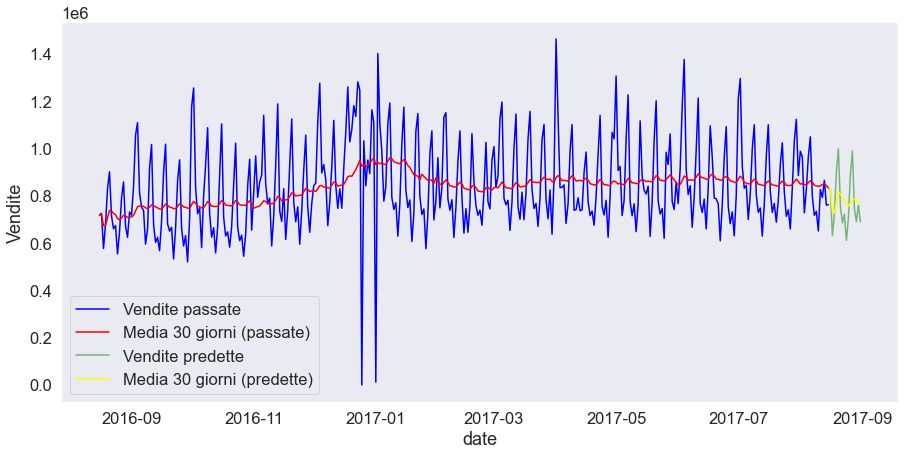

In [50]:
%%time

past_data = True
data_inizio = '2016-08-16'

predict_data = True

d = pd.DataFrame(test['date'])
d['pred'] = np.expm1(pred)

d = d.set_index('date').resample('D').sum()
pred_month_mean = d.rolling(window=30, min_periods=1).mean()

past_sales = pd.DataFrame(train.copy().set_index('date').loc[data_inizio:]['sales'])
past_sales['sales'] = np.expm1(past_sales['sales'])
past_sales = past_sales.resample('D').sum()
past_month_mean = past_sales.rolling(window=30, min_periods=1).mean()

fig, ax = plt.subplots(figsize=(15,7))
if past_data:
    sns.lineplot(data=past_sales, x='date', y='sales', color='blue', label='Vendite passate')
    sns.lineplot(data=past_month_mean, x='date', y='sales', label='Media 30 giorni (passate)', color='red')
if predict_data:
    sns.lineplot(data=d, x='date', y='pred', label='Vendite predette', alpha=0.5, color='green')
    sns.lineplot(data=pred_month_mean, x='date', y='pred', label='Media 30 giorni (predette)', color='yellow')

plt.ylabel('Vendite')
plt.legend()

# Conclusione

Inseriamo i valori predetti nella tabella e essendo un progetto di kaggle, inviarlo e vederne i risultati del modello (se è andato bene o male)

In [51]:
sample_submission['sales'] = np.expm1(pred)
sample_submission

,id,sales
0,3000888,3.848405
1,3000889,0.034072
2,3000890,6.257115
3,3000891,2417.208895
4,3000892,0.103843
...,...,...
28507,3029395,370.199978
28508,3029396,95.068082
28509,3029397,1231.147667
28510,3029398,68.690397


## Commenti

Nella parte della separazione dei dati da inserire al modello, il modello tende a mostrare risultati abbastanza deludenti se i dati per lo training diminuiscono o si cerca di fare una previsione di più giorni/mesi probabilmente dovuto a una certa complessità dei dati.

Per una migliore previsione si potrebbe cercare di semplificare i dati in singoli negozi o singoli dipartimenti.